# `AbsorptionPhysicalModel` Tutorial

Trey V. Wenger (c) April 2025

`AbsorptionPhysicalModel` is a re-parameterization of `AbsorptionModel` that places more physically motivated constraints on the parameter space.

In [1]:
# General imports    
import time

import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
import numpy as np
import pymc as pm

print("pymc version:", pm.__version__)
print("arviz version:", az.__version__)

import bayes_spec
print("bayes_spec version:", bayes_spec.__version__)

import caribou_hi
print("caribou_hi version:", caribou_hi.__version__)

# Notebook configuration
pd.options.display.max_rows = None

pymc version: 5.22.0
arviz version: 0.22.0dev
bayes_spec version: 1.7.8
caribou_hi version: 2.0.1+0.g9e7964e.dirty


## Simulating Data

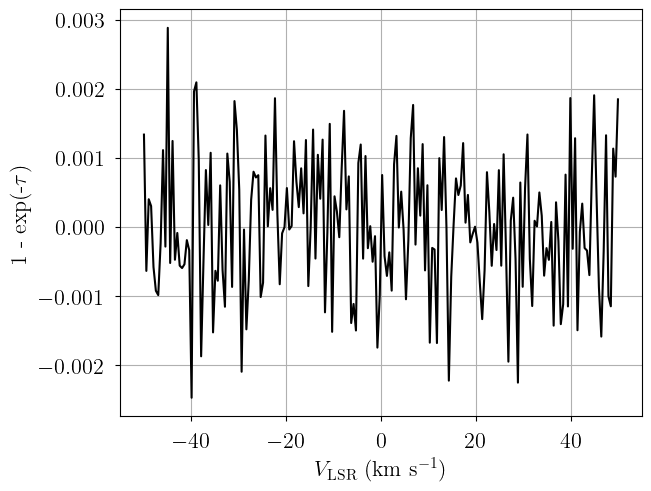

In [2]:
from bayes_spec import SpecData

# spectral axes definition
velo_axis = np.linspace(-50.0, 50.0, 200) # km s-1

# data noise can either be a scalar (assumed constant noise across the spectrum)
# or an array of the same length as the data
rms = 0.001 # 1 - exp(-tau)

# brightness data. In this case, we just throw in some random data for now
# since we are only doing this in order to simulate some actual data.
absorption = rms * np.random.randn(len(velo_axis))

dummy_data = {"absorption": SpecData(
    velo_axis,
    absorption,
    rms,
    xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
    ylabel=r"1 - exp(-$\tau$)",
)}

# Plot dummy data
fig, ax = plt.subplots(layout="constrained")
ax.plot(dummy_data["absorption"].spectral, dummy_data["absorption"].brightness, "k-")
ax.set_xlabel(dummy_data["absorption"].xlabel)
_ = ax.set_ylabel(dummy_data["absorption"].ylabel)

In [3]:
from caribou_hi import AbsorptionPhysicalModel

# Initialize and define the model
n_clouds = 3
baseline_degree = 0
model = AbsorptionPhysicalModel(
    dummy_data,
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    depth_nth_fwhm_power = 1/3, # assumed non-thermal FWHM vs. depth power law index
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_NHI_fwhm2_thermal=1.0e20, # column density / thermal FWHM^2 prior width (cm-2 km-2 s2)
    prior_fwhm2=500.0, # FWHM^2 prior width (km2 s-2)
    prior_fwhm2_thermal_fraction=[2.0, 2.0], # thermal FWHM^2 fraction prior shape
    prior_velocity=[0.0, 10.0], # velocity prior mean and width (km/s)
    prior_log10_n_alpha=[-6.0, 2.0], # log10(n_alpha) prior mean and width (cm-3)
    prior_nth_fwhm_1pc=[1.75, 0.25], # non-thermal FWHM at 1 pc prior mean and width (km s-1)
    prior_fwhm_L=None, # Assume Gaussian line profile
    prior_baseline_coeffs=None, # Default baseline priors
)
model.add_likelihood()

In [4]:
from caribou_hi import physics

# Simulation parameters
log10_nHI = np.array([1.25, 0.0, -0.5])
tkin = np.array([50.0, 300.0, 5000.0])
log10_n_alpha = np.array([-5.0, -6.0, -7.0])
depth = np.array([5.0, 25.0, 300.0])
nth_fwhm_1pc = np.array([1.25, 1.75, 1.5])

tspin = physics.calc_spin_temp(tkin, 10.0**log10_nHI, 10.0**log10_n_alpha).eval()
print("tspin", tspin)

fwhm2_nonthermal = physics.calc_nonthermal_fwhm(depth, nth_fwhm_1pc, 1/3)**2.0
print("fwhm2_nonthermal", fwhm2_nonthermal)

fwhm2_thermal = physics.calc_thermal_fwhm2(tkin)
print("fwhm2_thermal", fwhm2_thermal)

fwhm2 = fwhm2_nonthermal + fwhm2_thermal
print("fwhm2", fwhm2)

fwhm2_thermal_fraction = fwhm2_thermal/fwhm2
print("fwhm2_thermal_fraction", fwhm2_thermal_fraction)

log10_Pth = np.log10(tkin) + log10_nHI
print("log10_Pth", log10_Pth)

log10_NHI = log10_nHI + np.log10(depth) + 18.489351
print("log10_NHI", log10_NHI)

tau_total = physics.calc_tau_total(10.0**log10_NHI, tspin)
print("tau_total", tau_total)

sim_params = {
    "log10_NHI": log10_NHI,
    "fwhm2": fwhm2,
    "fwhm2_thermal_fraction": fwhm2_thermal_fraction,
    "velocity": np.array([-5.0, 5.0, 10.0]),
    "log10_n_alpha": log10_n_alpha,
    "nth_fwhm_1pc": nth_fwhm_1pc,
    "baseline_absorption_norm": [0.0],
}

# add derived quantities to sim_params
for key in model.cloud_deterministics:
    if key not in sim_params.keys():
        sim_params[key] = model.model[key].eval(sim_params, on_unused_input="ignore")

# Evaluate and save simulated observation
absorption = model.model["absorption"].eval(sim_params, on_unused_input="ignore")
data = {"absorption": SpecData(
    velo_axis,
    absorption,
    rms,
    xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
    ylabel=r"1 - exp(-$\tau$)",
)}

tspin [  49.99731723  297.73994712 2378.08874354]
fwhm2_nonthermal [  4.56877772  26.18400668 100.8316068 ]
fwhm2_thermal [  2.2876605  13.725963  228.76605  ]
fwhm2 [  6.85643822  39.90996968 329.5976568 ]
fwhm2_thermal_fraction [0.33365144 0.34392316 0.69407669]
log10_Pth [2.94897    2.47712125 3.19897   ]
log10_NHI [20.438321   19.88729101 20.46647225]
tau_total [3.01108799 0.14216839 0.06754502]


In [5]:
sim_params

{'log10_NHI': array([20.438321  , 19.88729101, 20.46647225]),
 'fwhm2': array([  6.85643822,  39.90996968, 329.5976568 ]),
 'fwhm2_thermal_fraction': array([0.33365144, 0.34392316, 0.69407669]),
 'velocity': array([-5.,  5., 10.]),
 'log10_n_alpha': array([-5., -6., -7.]),
 'nth_fwhm_1pc': array([1.25, 1.75, 1.5 ]),
 'baseline_absorption_norm': [0.0],
 'fwhm2_thermal': array([  2.2876605,  13.725963 , 228.76605  ]),
 'tkin': array([  50.,  300., 5000.]),
 'fwhm2_nonthermal': array([  4.56877772,  26.18400668, 100.8316068 ]),
 'depth': array([  5.,  25., 300.]),
 'log10_nHI': array([ 1.25,  0.  , -0.5 ]),
 'tspin': array([  49.99731723,  297.73994712, 2378.08874354]),
 'tau_total': array([3.01108799, 0.14216839, 0.06754502]),
 'log10_Pth': array([2.94897   , 2.47712125, 3.19897   ]),
 'log10_Pnth': array([4.73704003, 4.2452761 , 4.33083669]),
 'log10_Ptot': array([4.74405782, 4.25262043, 4.36176538])}

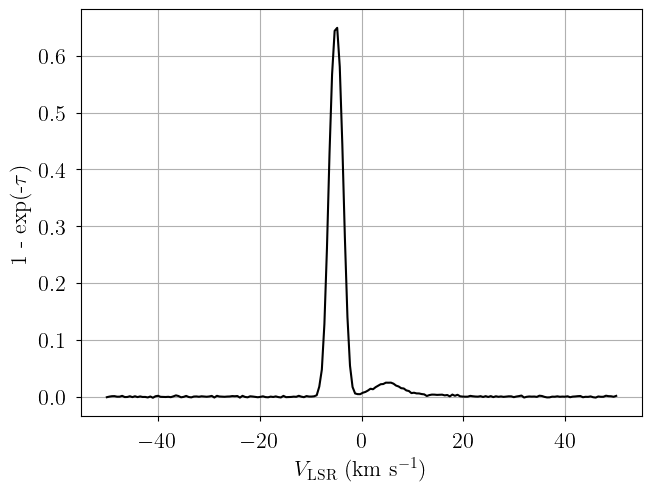

In [6]:
# Plot data
fig, ax = plt.subplots(layout="constrained")
ax.plot(data["absorption"].spectral, data["absorption"].brightness, "k-")
ax.set_xlabel(data["absorption"].xlabel)
_ = ax.set_ylabel(data["absorption"].ylabel)

## Model Definition

In [7]:
# Initialize and define the model
n_clouds = 3
model = AbsorptionPhysicalModel(
    data,
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    depth_nth_fwhm_power = 1/3, # assumed non-thermal FWHM vs. depth power law index
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_NHI_fwhm2_thermal=1.0e20, # column density / thermal FWHM^2 prior width (cm-2 km-2 s2)
    prior_fwhm2=500.0, # FWHM^2 prior width (km2 s-2)
    prior_fwhm2_thermal_fraction=[2.0, 2.0], # thermal FWHM^2 fraction prior shape
    prior_velocity=[0.0, 10.0], # velocity prior mean and width (km/s)
    prior_log10_n_alpha=[-6.0, 2.0], # log10(n_alpha) prior mean and width (cm-3)
    prior_nth_fwhm_1pc=[1.75, 0.25], # non-thermal FWHM at 1 pc prior mean and width (km s-1)
    prior_fwhm_L=None, # Assume Gaussian line profile
    prior_baseline_coeffs=None, # Default baseline priors
)
model.add_likelihood()

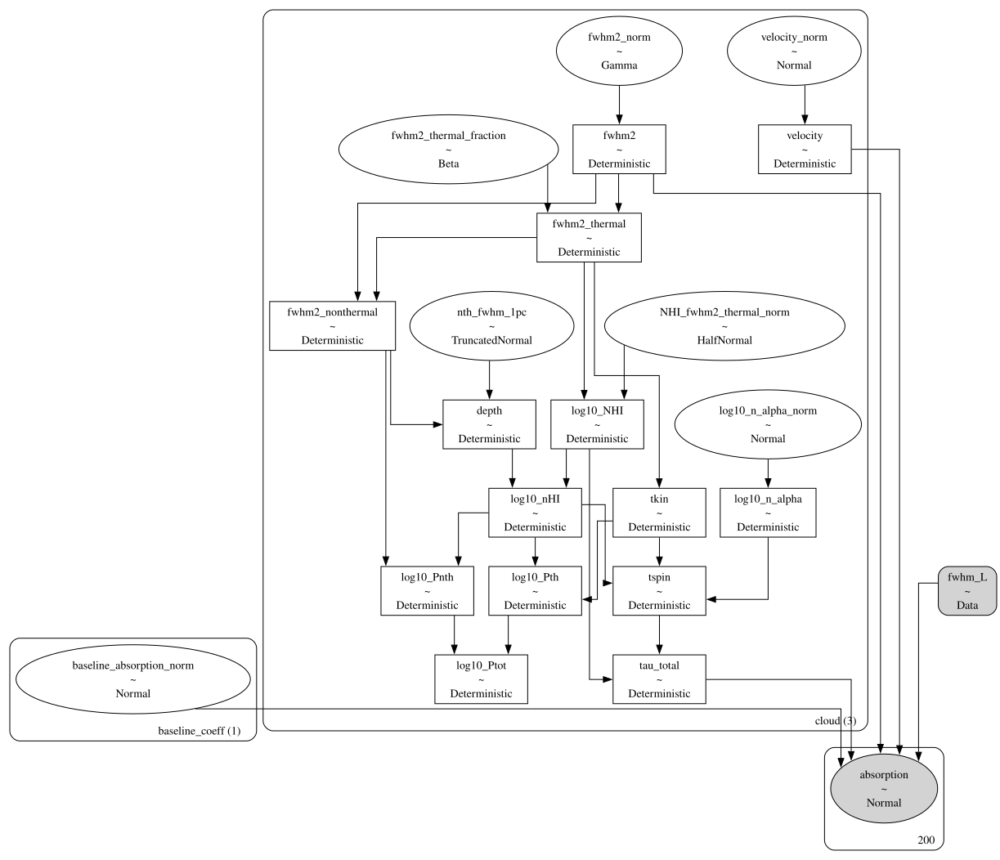

In [8]:
# Plot model graph
model.graph().render('absorption_physical_model', format='png')
model.graph()

In [9]:
# model string representation
print(model.model.str_repr())

baseline_absorption_norm ~ Normal(0, 1)
              fwhm2_norm ~ Gamma(0.5, f())
           velocity_norm ~ Normal(0, 1)
      log10_n_alpha_norm ~ Normal(0, 1)
            nth_fwhm_1pc ~ TruncatedNormal(1.75, 0.25, 0, inf)
  NHI_fwhm2_thermal_norm ~ HalfNormal(0, 1)
  fwhm2_thermal_fraction ~ Beta(2, 2)
                   fwhm2 ~ Deterministic(f(fwhm2_norm))
                velocity ~ Deterministic(f(velocity_norm))
           log10_n_alpha ~ Deterministic(f(log10_n_alpha_norm))
           fwhm2_thermal ~ Deterministic(f(fwhm2_thermal_fraction, fwhm2_norm))
                    tkin ~ Deterministic(f(fwhm2_thermal_fraction, fwhm2_norm))
               log10_NHI ~ Deterministic(f(NHI_fwhm2_thermal_norm, fwhm2_thermal_fraction, fwhm2_norm))
        fwhm2_nonthermal ~ Deterministic(f(fwhm2_thermal_fraction, fwhm2_norm))
                   depth ~ Deterministic(f(nth_fwhm_1pc, fwhm2_thermal_fraction, fwhm2_norm))
               log10_nHI ~ Deterministic(f(nth_fwhm_1pc, NHI_fwhm2_thermal_

Sampling: [NHI_fwhm2_thermal_norm, absorption, baseline_absorption_norm, fwhm2_norm, fwhm2_thermal_fraction, log10_n_alpha_norm, nth_fwhm_1pc, velocity_norm]


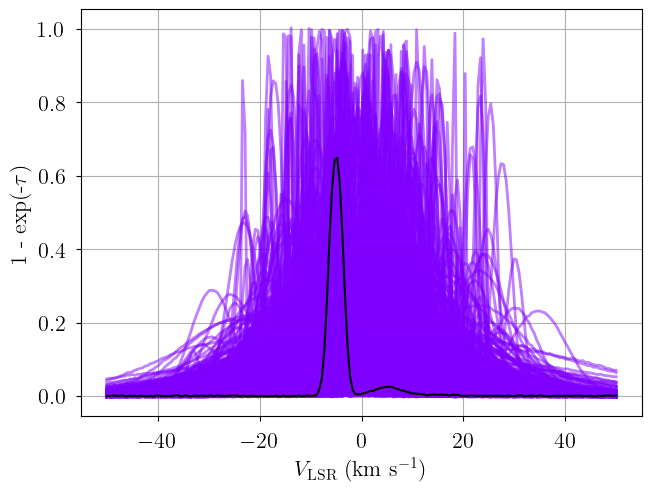

In [10]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=1000,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [11]:
print(model.cloud_freeRVs)
print(model.cloud_deterministics)

['fwhm2_norm', 'velocity_norm', 'log10_n_alpha_norm', 'nth_fwhm_1pc', 'NHI_fwhm2_thermal_norm', 'fwhm2_thermal_fraction']
['fwhm2', 'velocity', 'log10_n_alpha', 'fwhm2_thermal', 'tkin', 'log10_NHI', 'fwhm2_nonthermal', 'depth', 'log10_nHI', 'tspin', 'tau_total', 'log10_Pth', 'log10_Pnth', 'log10_Ptot']


['fwhm2', 'velocity', 'log10_n_alpha', 'fwhm2_thermal', 'tkin', 'log10_NHI', 'fwhm2_nonthermal', 'depth', 'log10_nHI', 'tspin', 'tau_total', 'log10_Pth', 'log10_Pnth', 'log10_Ptot', 'nth_fwhm_1pc', 'fwhm2_thermal_fraction']


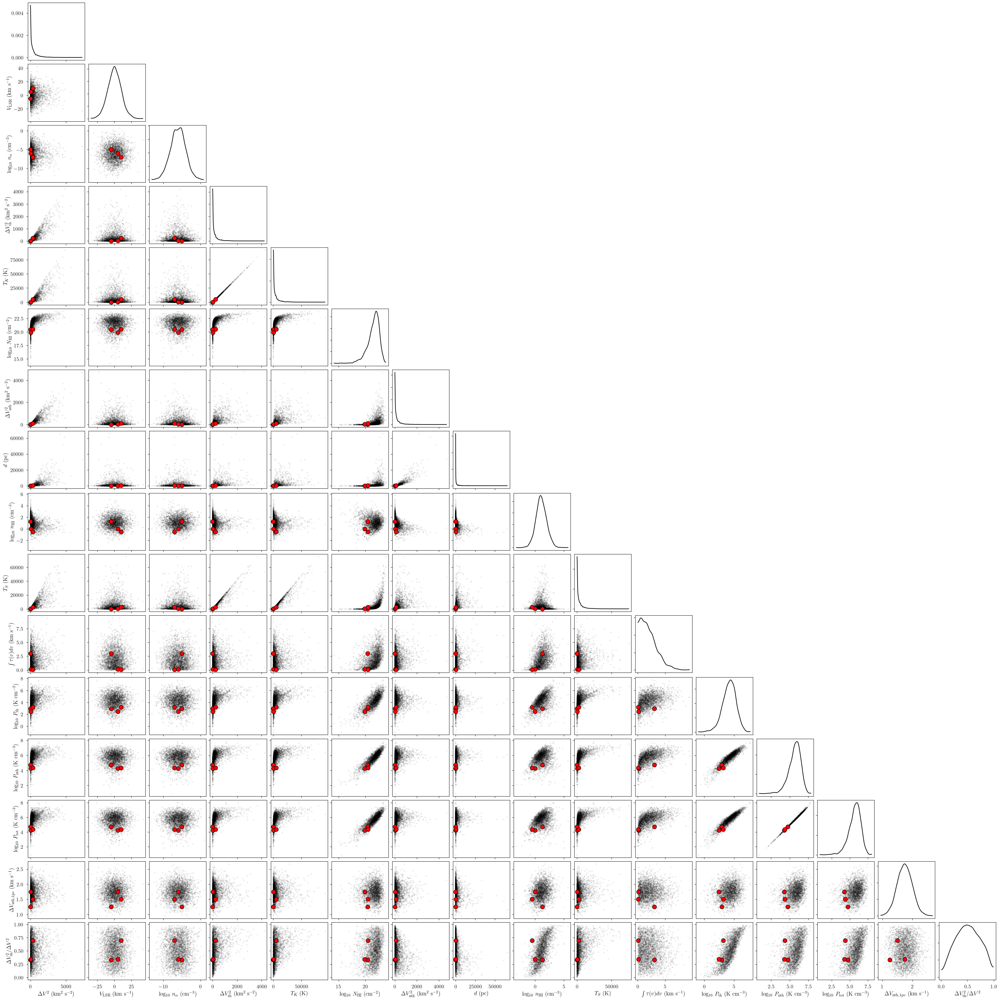

In [12]:
from bayes_spec.plots import plot_pair

var_names = model.cloud_deterministics + [p for p in model.cloud_freeRVs if "_norm" not in p]
print(var_names)
_ = plot_pair(
    prior.prior, # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=sim_params, # truths
)

## Variational Inference

In [13]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.05, # VI relative convergence threshold
    abs_tolerance = 0.05, # VI absolute convergence threshold
    learning_rate = 0.01, # VI learning rate
    start = {"velocity_norm": np.linspace(-3.0, 3.0, model.n_clouds)},
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 8200
Interrupted at 8,199 [8%]: Average Loss = 1.4605e+05


Output()

Runtime: 0.43 minutes


In [14]:
pm.summary(model.trace.posterior)

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_absorption_norm[0],-0.465,0.080,-0.624,-0.320,0.003,0.002,1003.0,720.0,NaN
velocity_norm[0],1.415,0.061,1.304,1.522,0.002,0.001,976.0,979.0,NaN
velocity_norm[1],-0.499,0.000,-0.500,-0.499,0.000,0.000,931.0,944.0,NaN
velocity_norm[2],0.505,0.006,0.494,0.516,0.000,0.000,928.0,777.0,NaN
log10_n_alpha_norm[0],0.292,0.781,-1.185,1.681,0.025,0.017,992.0,922.0,NaN
log10_n_alpha_norm[1],-0.029,1.029,-1.927,1.931,0.033,0.024,998.0,860.0,NaN
log10_n_alpha_norm[2],0.314,0.825,-1.230,1.817,0.026,0.017,1007.0,988.0,NaN
fwhm2_norm[0],0.174,0.043,0.103,0.256,0.002,0.001,725.0,605.0,NaN
fwhm2_norm[1],0.014,0.000,0.014,0.014,0.000,0.000,1080.0,975.0,NaN
fwhm2_norm[2],0.089,0.003,0.083,0.094,0.000,0.000,838.0,1006.0,NaN


Sampling: [absorption]


Output()

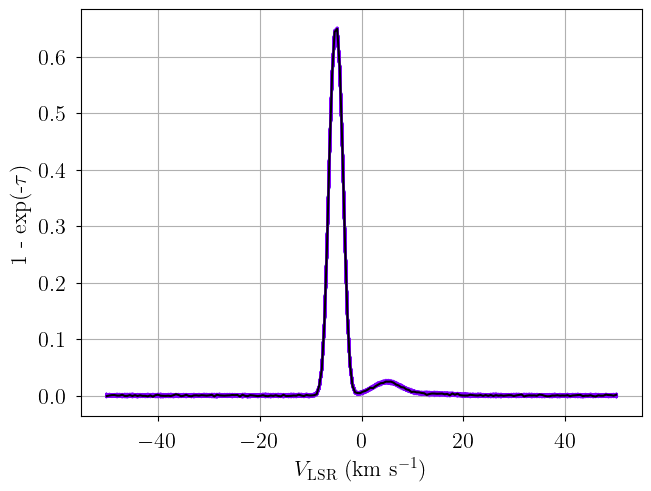

In [15]:
posterior = model.sample_posterior_predictive(
    thin=10, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

## Posterior Sampling: MCMC

In [16]:
start = time.time()
model.sample(
    init="advi+adapt_diag",  # initialization strategy
    tune=1000,  # tuning samples
    draws=1000,  # posterior samples
    chains=8,  # number of independent chains
    cores=8,  # number of parallel chains
    init_kwargs={
        "rel_tolerance": 0.05,
        "abs_tolerance": 0.05,
        "learning_rate": 0.01,
        "start": {"velocity_norm": np.linspace(-3.0, 3.0, model.n_clouds)},
    },  # VI initialization arguments
    nuts_kwargs={"target_accept": 0.9},  # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 8200
Interrupted at 8,199 [8%]: Average Loss = 1.4605e+05
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_absorption_norm, fwhm2_norm, velocity_norm, log10_n_alpha_norm, nth_fwhm_1pc, NHI_fwhm2_thermal_norm, fwhm2_thermal_fraction]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 11 seconds.


Adding log-likelihood to trace


Output()

There were 24 divergences in converged chains.
Runtime: 0.88 minutes


In [17]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


In [18]:
print("solutions:", model.solutions)
az.summary(model.trace["solution_0"])
# this also works: az.summary(model.trace.solution_0)

solutions: [0]


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_absorption_norm[0],-0.491,0.087,-0.657,-0.332,0.001,0.001,5803.0,4905.0,1.0
velocity_norm[0],1.199,0.203,0.840,1.530,0.005,0.002,1649.0,2177.0,1.0
velocity_norm[1],-0.500,0.000,-0.500,-0.500,0.000,0.000,6173.0,4239.0,1.0
velocity_norm[2],0.499,0.008,0.482,0.515,0.000,0.000,3280.0,3543.0,1.0
log10_n_alpha_norm[0],0.105,0.986,-1.754,1.944,0.017,0.012,3247.0,4173.0,1.0
log10_n_alpha_norm[1],0.004,0.994,-1.808,1.933,0.013,0.012,6278.0,3685.0,1.0
log10_n_alpha_norm[2],0.008,0.991,-1.829,1.865,0.014,0.011,5316.0,5154.0,1.0
fwhm2_norm[0],0.343,0.160,0.084,0.613,0.004,0.002,1817.0,2995.0,1.0
fwhm2_norm[1],0.014,0.000,0.014,0.014,0.000,0.000,4865.0,2657.0,1.0
fwhm2_norm[2],0.084,0.007,0.071,0.097,0.000,0.000,1891.0,2131.0,1.0


Sampling: [absorption]


Output()

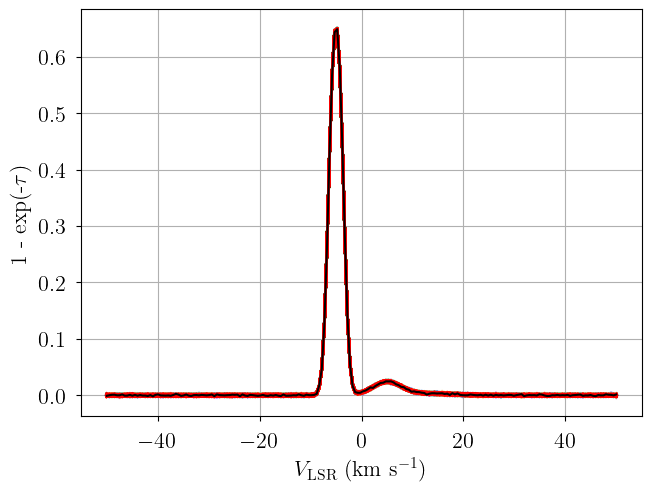

In [19]:
posterior = model.sample_posterior_predictive(
    thin=10, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

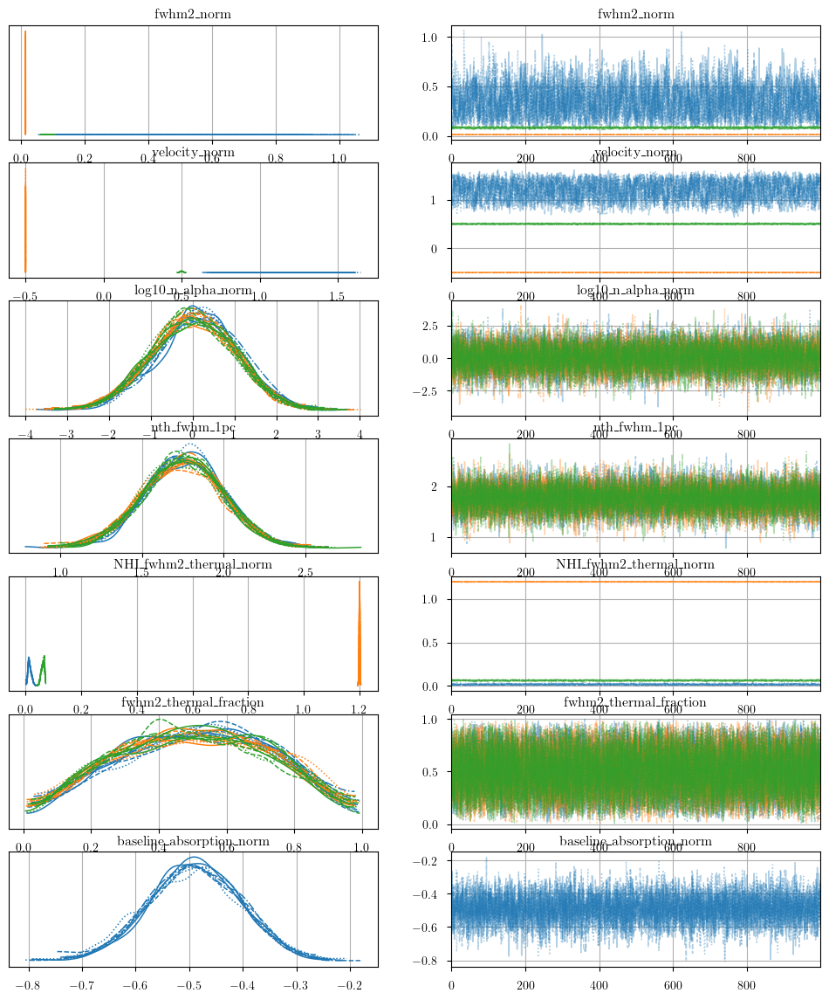

In [20]:
from bayes_spec.plots import plot_traces

_ = plot_traces(model.trace.solution_0, model.cloud_freeRVs + model.baseline_freeRVs + model.hyper_freeRVs)

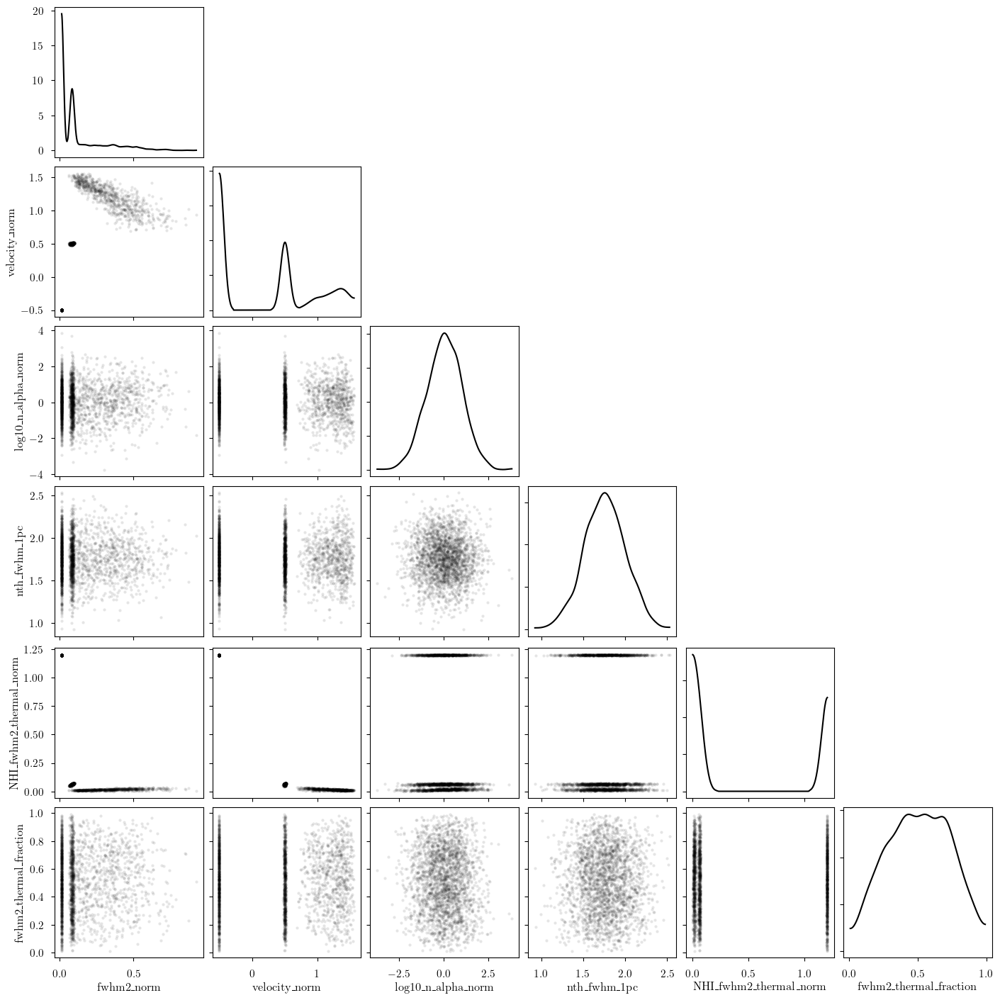

In [21]:
_ = plot_pair(
    model.trace.solution_0.sel(draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

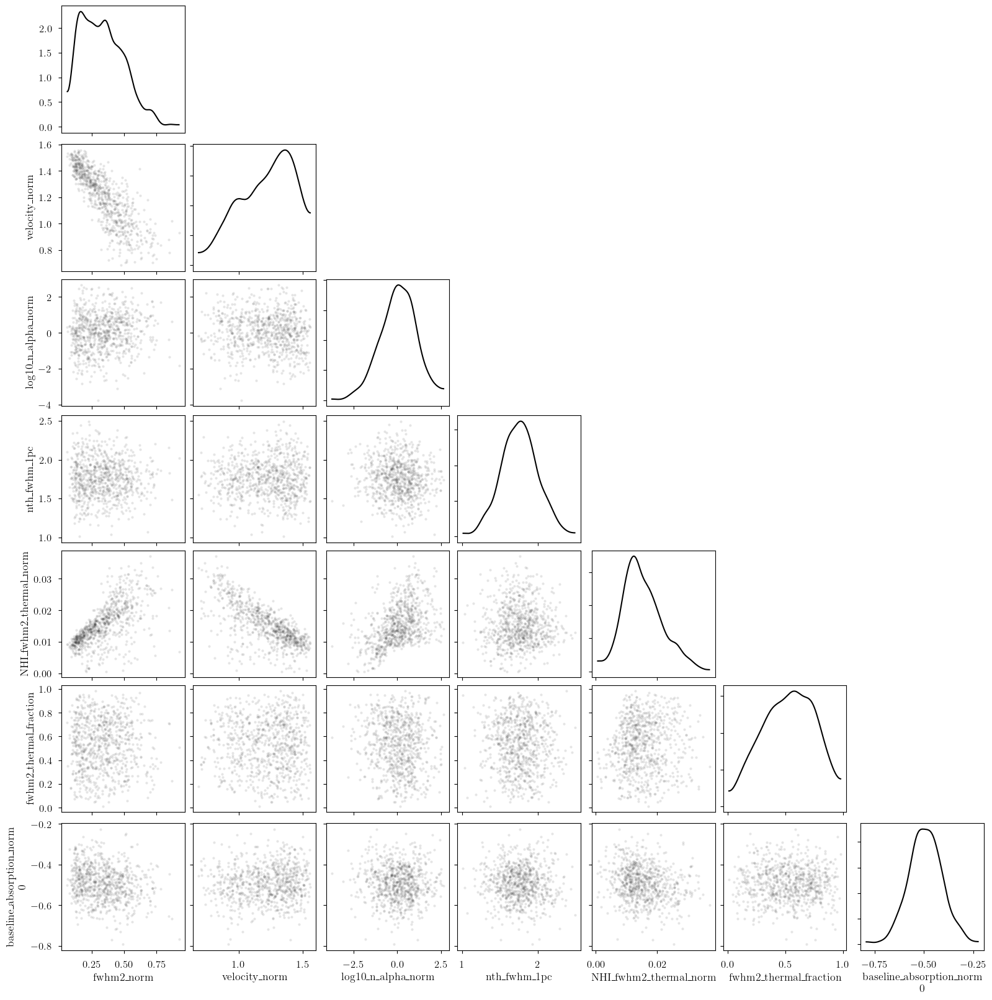

In [22]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

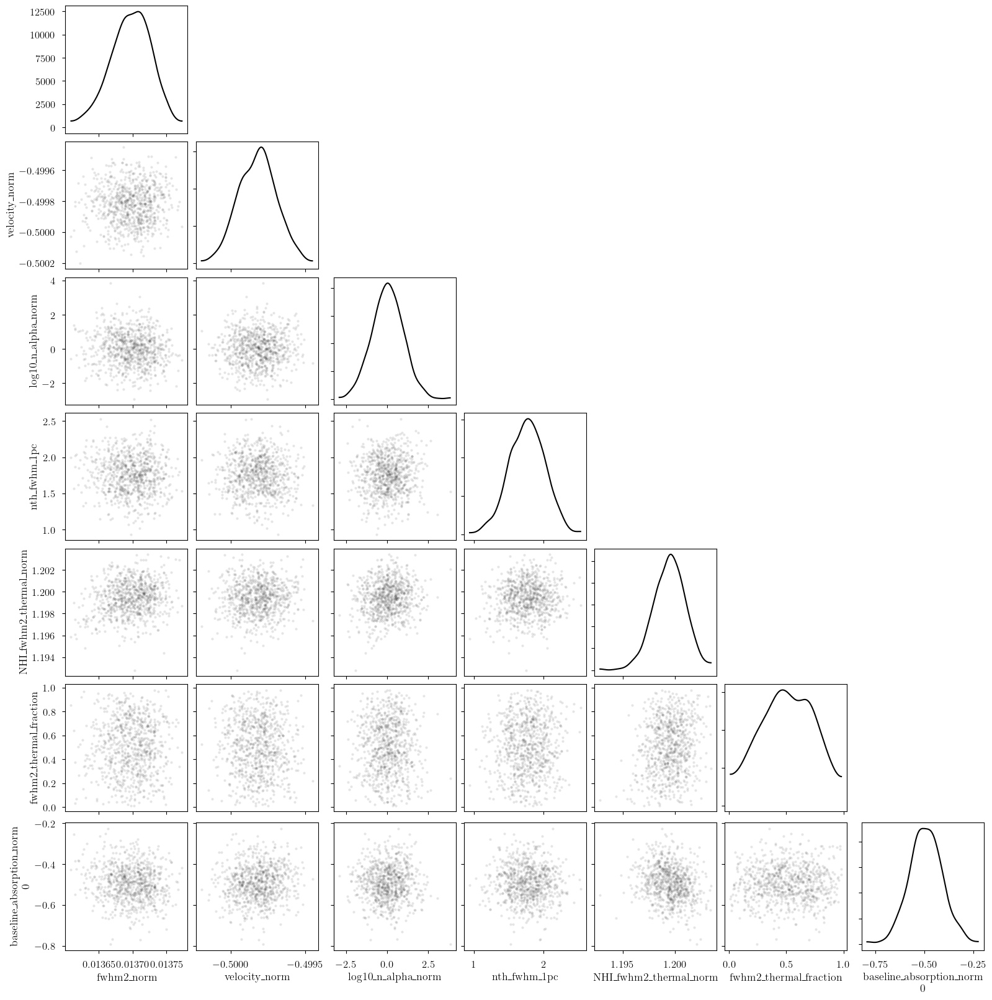

In [23]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=1, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

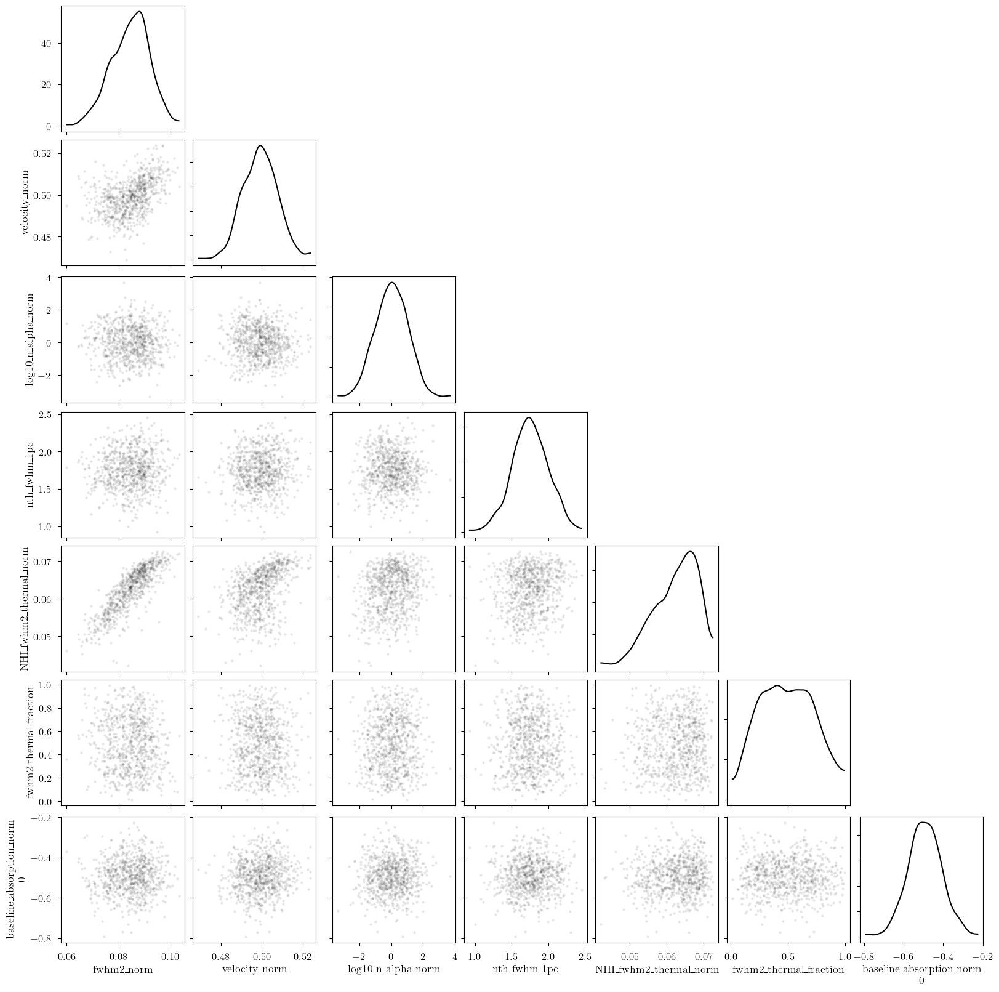

In [24]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=2, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

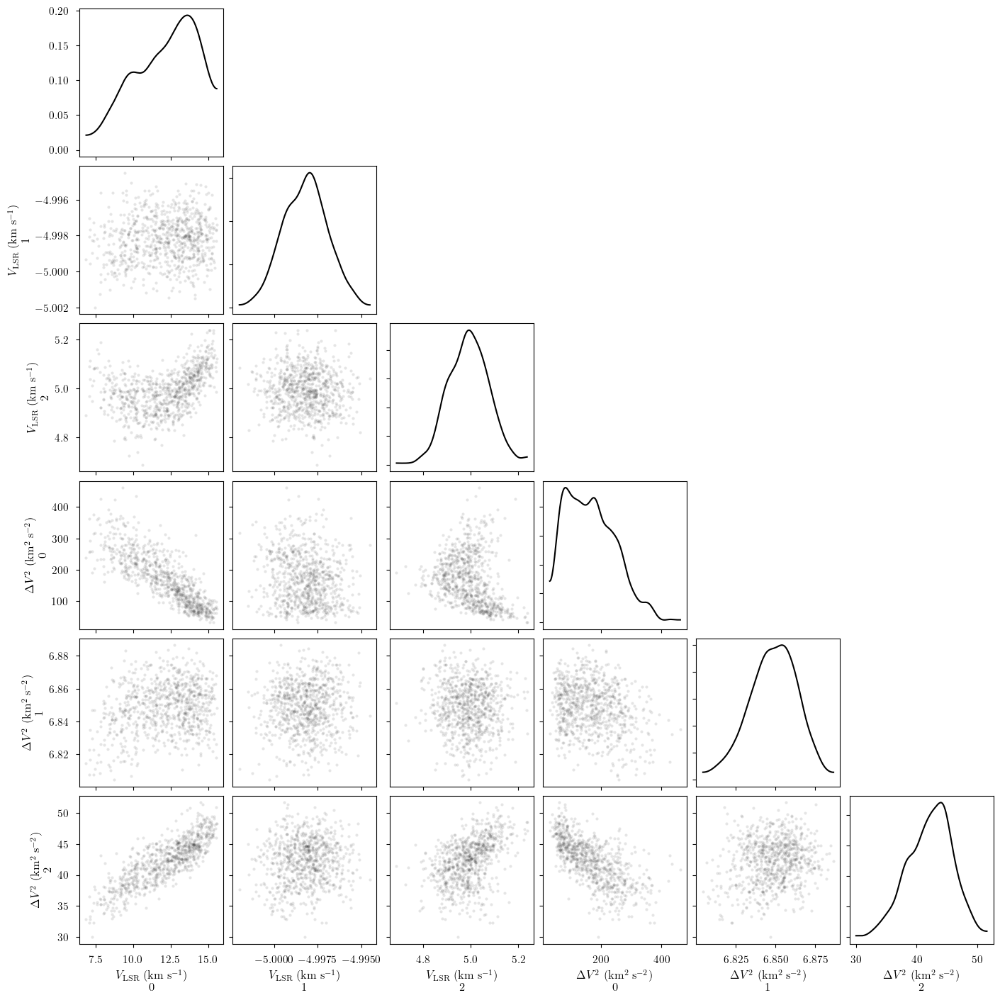

In [25]:
scatter_kwargs = {
    "marker": ".",
    "color": "k",
    "alpha": 0.1,
}
size = int(2.0 * (2 * model.n_clouds + 1))
textsize = int(np.sqrt(size)) + 8

with az.rc_context(rc={"plot.max_subplots": None}):
    axes = az.plot_pair(
        model.trace.solution_0.sel(draw=slice(None, None, 10)),
        var_names = ['velocity', 'fwhm2'],
        kind = 'scatter',
        figsize = (size, size),
        labeller = model.labeller,
        marginals = True,
        marginal_kwargs = {"color": "k"},
        textsize = textsize,
        scatter_kwargs = scatter_kwargs,
        backend_kwargs = {"layout": "constrained"},
    )
axes[0][0].set_ylabel("")
for ax in axes.flatten():
    ax.grid(False)

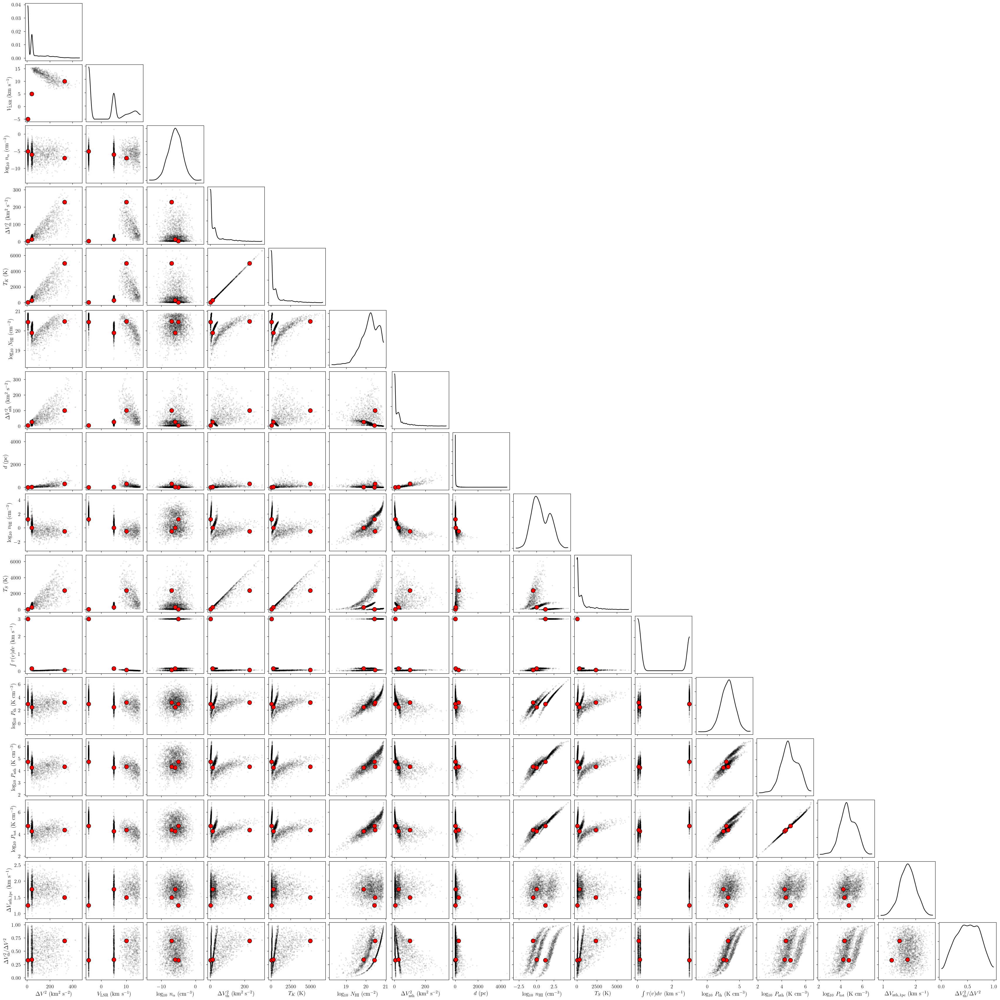

In [26]:
_ = plot_pair(
    model.trace.solution_0.sel(draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=sim_params, # truths
)

In [27]:
# identify simulation cloud corresponding to each posterior cloud
sim_cloud_map = {}
for i in range(n_clouds):
    posterior_velocity = model.trace.solution_0['velocity'].sel(cloud=i).data.mean()
    match = np.argmin(np.abs(sim_params["velocity"] - posterior_velocity))
    sim_cloud_map[i] = match
sim_cloud_map

{0: np.int64(2), 1: np.int64(0), 2: np.int64(1)}

In [28]:
print("cloud freeRVs", model.cloud_freeRVs)
print("cloud deterministics", model.cloud_deterministics)
print("hyper freeRVs", model.hyper_freeRVs)
print("hyper deterministics", model.hyper_deterministics)

cloud freeRVs ['fwhm2_norm', 'velocity_norm', 'log10_n_alpha_norm', 'nth_fwhm_1pc', 'NHI_fwhm2_thermal_norm', 'fwhm2_thermal_fraction']
cloud deterministics ['fwhm2', 'velocity', 'log10_n_alpha', 'fwhm2_thermal', 'tkin', 'log10_NHI', 'fwhm2_nonthermal', 'depth', 'log10_nHI', 'tspin', 'tau_total', 'log10_Pth', 'log10_Pnth', 'log10_Ptot']
hyper freeRVs []
hyper deterministics []


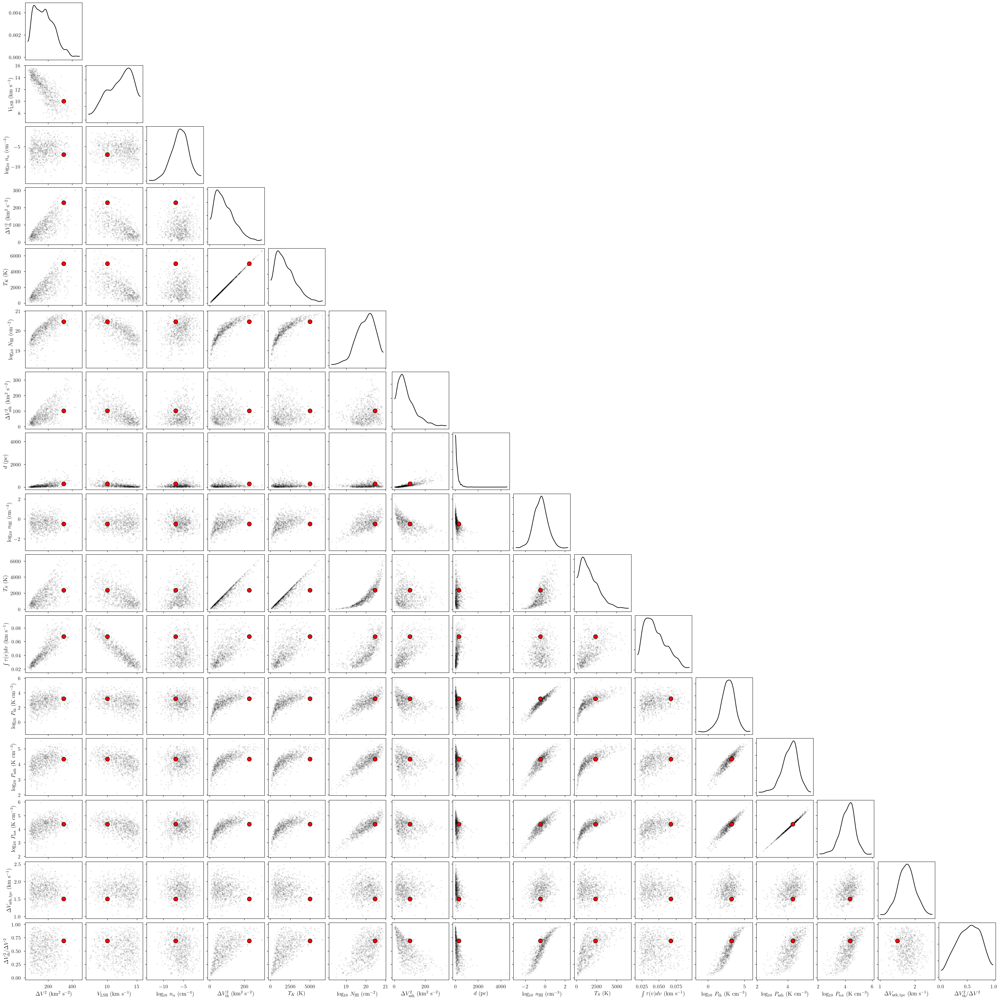

In [29]:
cloud = 0

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

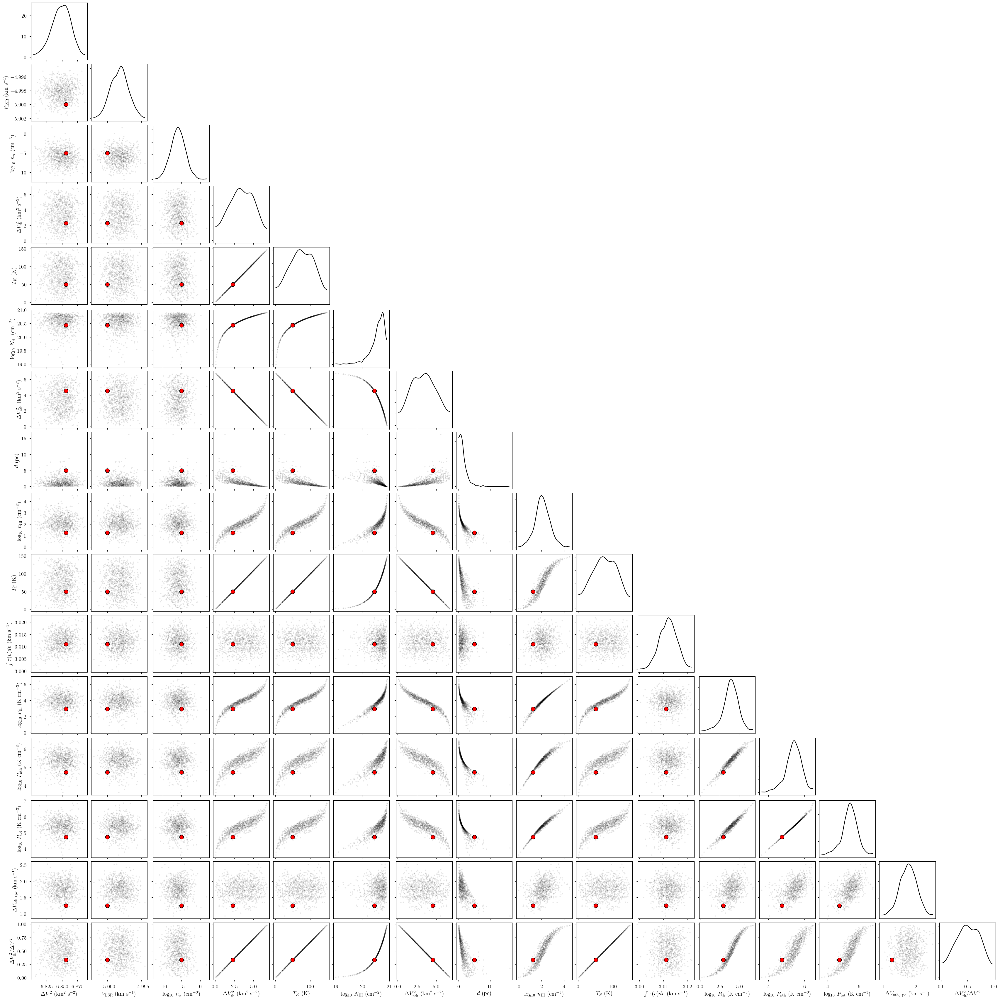

In [30]:
cloud = 1

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

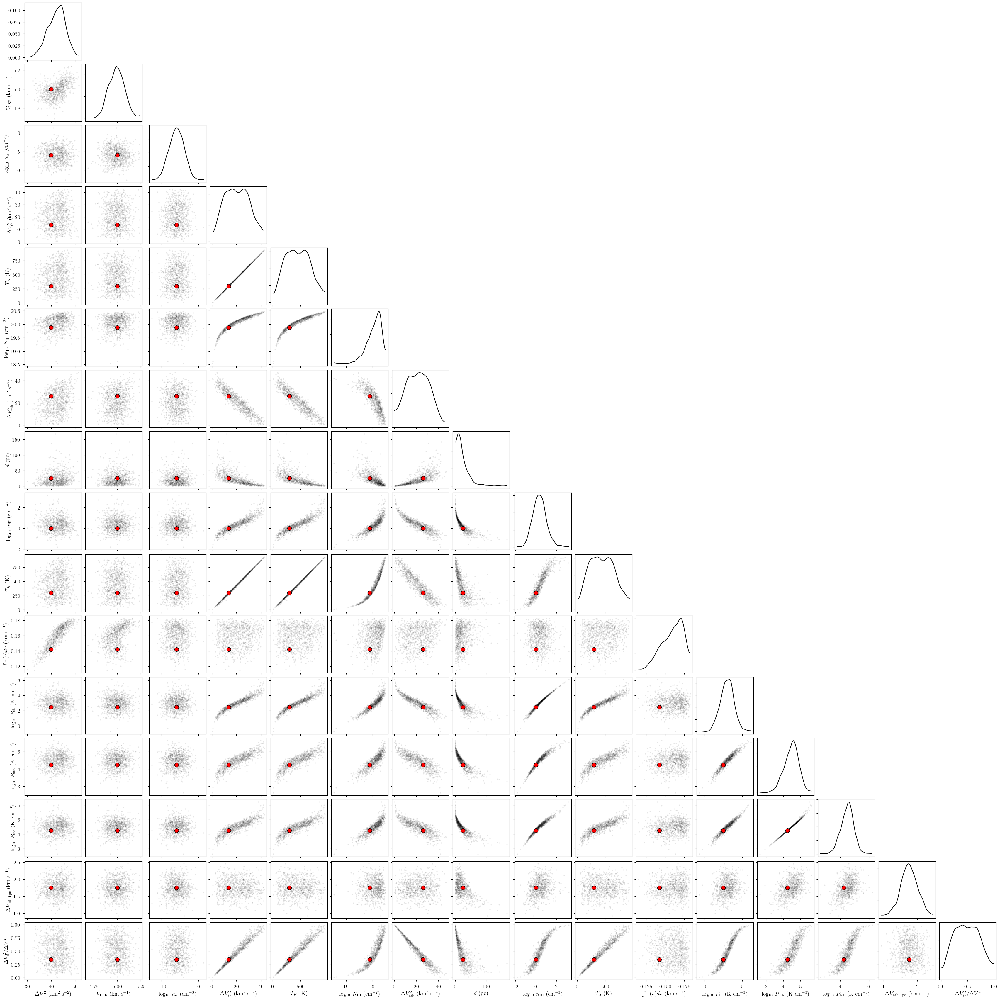

In [31]:
cloud = 2

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

In [32]:
point_stats = az.summary(model.trace.solution_0, kind='stats')
print("BIC:", model.bic())
display(point_stats)

BIC: -2128.057491805271


,mean,sd,hdi_3%,hdi_97%
baseline_absorption_norm[0],-0.491,0.087,-0.657,-0.332
velocity_norm[0],1.199,0.203,0.840,1.530
velocity_norm[1],-0.500,0.000,-0.500,-0.500
velocity_norm[2],0.499,0.008,0.482,0.515
log10_n_alpha_norm[0],0.105,0.986,-1.754,1.944
log10_n_alpha_norm[1],0.004,0.994,-1.808,1.933
log10_n_alpha_norm[2],0.008,0.991,-1.829,1.865
fwhm2_norm[0],0.343,0.160,0.084,0.613
fwhm2_norm[1],0.014,0.000,0.014,0.014
fwhm2_norm[2],0.084,0.007,0.071,0.097
